# Basis Function Expansion: Verification

The exponential oblate halo potential is evaluated using a **spherical-harmonic / Legendre polynomial basis expansion**.
Rather than computing the potential integral analytically at every evaluation point (which is expensive for
flattened geometries), `tstrippy` pre-projects the density onto a set of radial basis functions and even-degree
Legendre polynomials $P_l(\cos\theta)$, then interpolates.

## The density model

The target density is the exponential oblate halo:

$$
\rho(R, z) = \rho_0 \exp\!\left[-\frac{1}{s_0}\sqrt{R^2 + \frac{z^2}{q^2}}\right]
$$

where $R = \sqrt{x^2+y^2}$ is the cylindrical radius, $s_0$ is the scale radius, and $q \leq 1$ controls the
flattening along the $z$ axis.  The spherical expansion is exact as $\ell_{\max} \to \infty$; the figures below
show how quickly it converges in practice.

## The expansion

The density and potential are written as

$$
\rho(r, \mu) = \sum_{l=0,2,4,\ldots}^{\ell_{\max}} \rho_l(r)\, P_l(\mu), \qquad \mu = \cos\theta = z/r
$$

where the radial coefficients $\rho_l(r)$ are computed by Gaussian quadrature in the Fortran kernel
(`project_exponential_oblate_halo`) and stored on a log-spaced grid.  The potential coefficients
$\Phi_l(r)$ follow from Green's function integration.

Only even-$l$ terms appear because the density is symmetric about the equatorial plane.

## What this notebook shows

For each value of $\ell_{\max}$ we generate a figure with one row per flattening $q$:

| Column | Content |
|---|---|
| 0 | Analytic $\log_{10}\rho$ in the $xz$ plane |
| 1 | Basis-reconstructed $\log_{10}\rho$ in the $xz$ plane |
| 2 | Gravitational potential $\Phi$ in the $xz$ plane |
| 3 | Gravitational potential $\Phi$ in the $xy$ plane |

The density reconstruction (cols 0–1) uses `tstrippy.bfe.reconstruct_rho_from_basis` entirely in NumPy.
The potential (cols 2–3) is evaluated by the compiled Fortran routine via `tstrippy.bfe.evaluate_phi_map`.

In [1]:
from astropy import constants as const
from astropy import units as u
import matplotlib.pyplot as plt
import numpy as np
import tstrippy
from tstrippy.bfe import reconstruct_rho_from_basis, init_basis_tables, evaluate_phi_map

plt.rcParams.update(
    {
        "text.usetex": True,
        "font.family": "serif",
        "font.serif": ["Computer Modern Roman"],
        "font.size": 12,
    }
)

## Helper functions (notebook-local)

The functions below are specific to this verification figure and live here rather than in the library.

In [2]:
def make_nx4_panel(
    nrows,
    page_width=8.25,
    margin_left=0.8,
    margin_right=0.4,
    margin_bottom=0.5,
    margin_top=0.25,
    gap=0.18,
    y_label_space=0.75,
    x_label_space=0.45,
    title_space=2.5,
    xlabel=None,
    ylabel=None,
    title=None,
):
    """Build touching nrows x 4 layout with a centre gap between columns 2 and 3."""
    usable_w = page_width - margin_left - margin_right
    panel = (usable_w - gap - y_label_space) / 4.0
    if panel <= 0:
        raise ValueError("Panel size <= 0. Increase page width or reduce margins/spaces.")

    fig_h = margin_bottom + x_label_space + nrows * panel + title_space + margin_top
    fig = plt.figure(figsize=(page_width, fig_h))
    axes = np.empty((nrows, 4), dtype=object)

    x0 = margin_left + y_label_space
    y0 = margin_bottom + x_label_space
    for r in range(nrows):
        for c in range(4):
            x_in = x0 + c * panel + (gap if c >= 2 else 0.0)
            y_in = y0 + (nrows - 1 - r) * panel
            ax = fig.add_axes(
                [x_in / page_width, y_in / fig_h, panel / page_width, panel / fig_h]
            )
            ax.set_box_aspect(1.0)
            if r < nrows - 1:
                ax.tick_params(labelbottom=False)
            if c > 0:
                ax.tick_params(labelleft=False)
            axes[r, c] = ax

    if xlabel is not None:
        xc = (x0 + 2.0 * panel + 0.5 * gap) / page_width
        fig.supxlabel(xlabel, x=xc, y=(margin_bottom + 0.40 * x_label_space) / fig_h)
    if ylabel is not None:
        fig.supylabel(ylabel, x=(margin_left + 0.45 * y_label_space) / page_width)
    if title is not None:
        yt = (y0 + nrows * panel + 0.50 * title_space) / fig_h
        fig.suptitle(title, y=yt, va="top", ha="center", multialignment="center")

    return fig, axes


def analytic_rho(x, y, z, rho0, s0, q):
    r_cyl = np.sqrt(x * x + y * y)
    m = np.sqrt(r_cyl * r_cyl + (z * z) / (q * q))
    return rho0 * np.exp(-m / s0)


def build_plane_maps(potential_fn, params, rho0, s0, q, basis_r_grid, basis_rho_l_grid, lmax, rlim=10.0, npoints=120):
    xs = np.linspace(-rlim, rlim, npoints)
    ys = np.linspace(-rlim, rlim, npoints)
    zs = np.linspace(-rlim, rlim, npoints)

    x_xy, y_xy = np.meshgrid(xs, ys, indexing="xy")
    z_xy = np.zeros_like(x_xy)

    x_xz, z_xz = np.meshgrid(xs, zs, indexing="xy")
    y_xz = np.zeros_like(x_xz)

    rho_analytic_xz = analytic_rho(x_xz, y_xz, z_xz, rho0, s0, q)
    rho_basis_xz = reconstruct_rho_from_basis(x_xz, y_xz, z_xz, basis_r_grid, basis_rho_l_grid, lmax)
    phi_xz = evaluate_phi_map(potential_fn, params, x_xz, y_xz, z_xz)
    phi_xy = evaluate_phi_map(potential_fn, params, x_xy, y_xy, z_xy)

    return {
        "x_xy": x_xy, "y_xy": y_xy,
        "x_xz": x_xz, "z_xz": z_xz,
        "rho_analytic_xz": rho_analytic_xz,
        "rho_basis_xz": rho_basis_xz,
        "phi_xz": phi_xz,
        "phi_xy": phi_xy,
    }


def plot_row(axes_row, maps, q):
    rho_a = maps["rho_analytic_xz"]
    rho_b = maps["rho_basis_xz"]
    phi_xz = maps["phi_xz"]
    phi_xy = maps["phi_xy"]
    x_xz = maps["x_xz"]
    z_xz = maps["z_xz"]
    x_xy = maps["x_xy"]
    y_xy = maps["y_xy"]

    eps_rho = max(np.nanmax(rho_a), np.nanmax(rho_b), 1.0) * 1e-12
    log_rho_a = np.log10(np.clip(rho_a, eps_rho, None))
    log_rho_b = np.log10(np.clip(rho_b, eps_rho, None))
    vmin_rho = log_rho_a.min()
    vmax_rho = log_rho_a.max()

    vmin_phi = min(phi_xz.min(), phi_xy.min())
    vmax_phi = max(phi_xz.max(), phi_xy.max())

    ax0, ax1, ax2, ax3 = axes_row
    ax0.pcolormesh(x_xz, z_xz, log_rho_a, shading="auto", cmap="magma", vmin=vmin_rho, vmax=vmax_rho)
    ax1.pcolormesh(x_xz, z_xz, log_rho_b, shading="auto", cmap="magma", vmin=vmin_rho, vmax=vmax_rho)
    ax2.pcolormesh(x_xz, z_xz, phi_xz, shading="auto", cmap="viridis", vmin=vmin_phi, vmax=vmax_phi)
    ax3.pcolormesh(x_xy, y_xy, phi_xy, shading="auto", cmap="viridis", vmin=vmin_phi, vmax=vmax_phi)

    levels_rho = np.linspace(vmin_rho, vmax_rho, 8)
    levels_phi = np.linspace(vmin_phi, vmax_phi, 8)
    ax0.contour(x_xz, z_xz, log_rho_a, levels=levels_rho, colors="k", linewidths=0.6, alpha=0.7)
    ax1.contour(x_xz, z_xz, log_rho_b, levels=levels_rho, colors="k", linewidths=0.6, alpha=0.7)
    ax2.contour(x_xz, z_xz, phi_xz, levels=levels_phi, colors="k", linewidths=0.6, alpha=0.7)
    ax3.contour(x_xy, y_xy, phi_xy, levels=levels_phi, colors="k", linewidths=0.6, alpha=0.7)

    ax0.text(0.03, 0.90, rf"$q={q:.1f}$", transform=ax0.transAxes, color="w")

## Physical parameters and sweep settings

In [3]:
rho0 = 1e10 / (2 * np.pi * 10 * 2)
s0 = 4.0

unit_v = u.km / u.s
unit_g = unit_v**2 * (u.kpc / u.M_sun)
G = const.G.to(unit_g).value

q_values = np.linspace(0.1, 0.7, 5)
lmax_values = np.arange(3, 50, 2)

nr = 100
rmin = 1.0e-4
rmax = 1.0e3

## Sweep over $\ell_{\max}$

Each cell below produces one verification figure.  Rows correspond to different flattenings $q$;
columns show (left to right): analytic $\rho$, basis $\rho$, $\Phi$ in $xz$, $\Phi$ in $xy$.

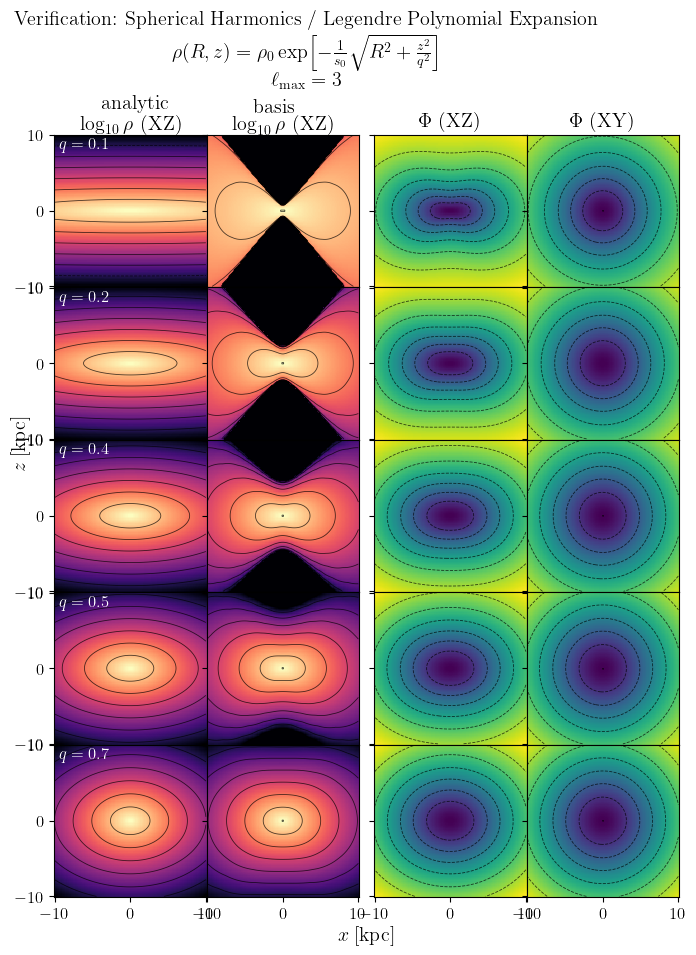

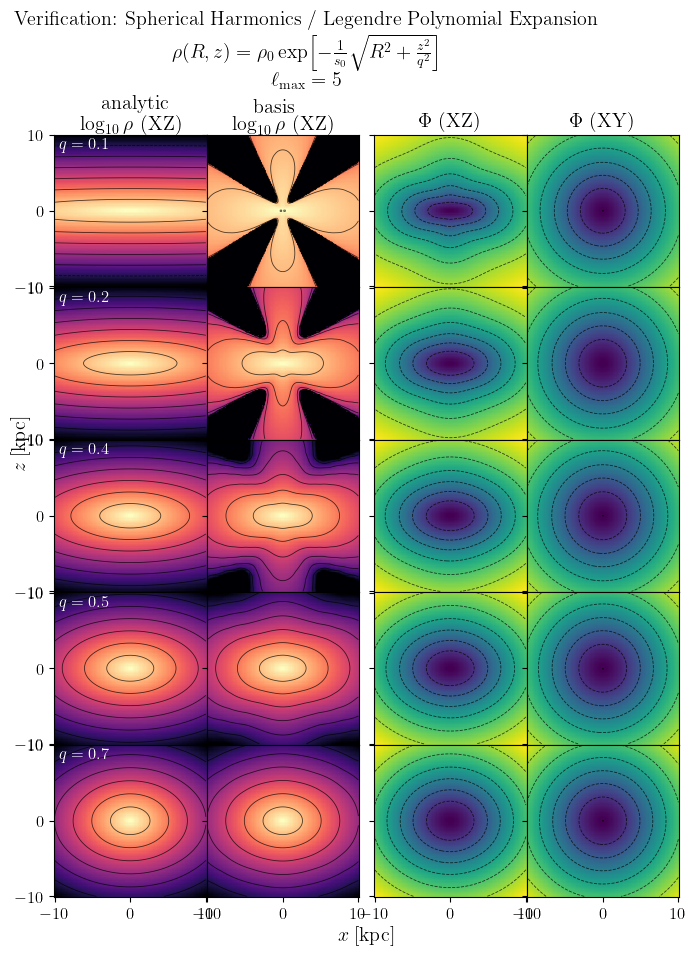

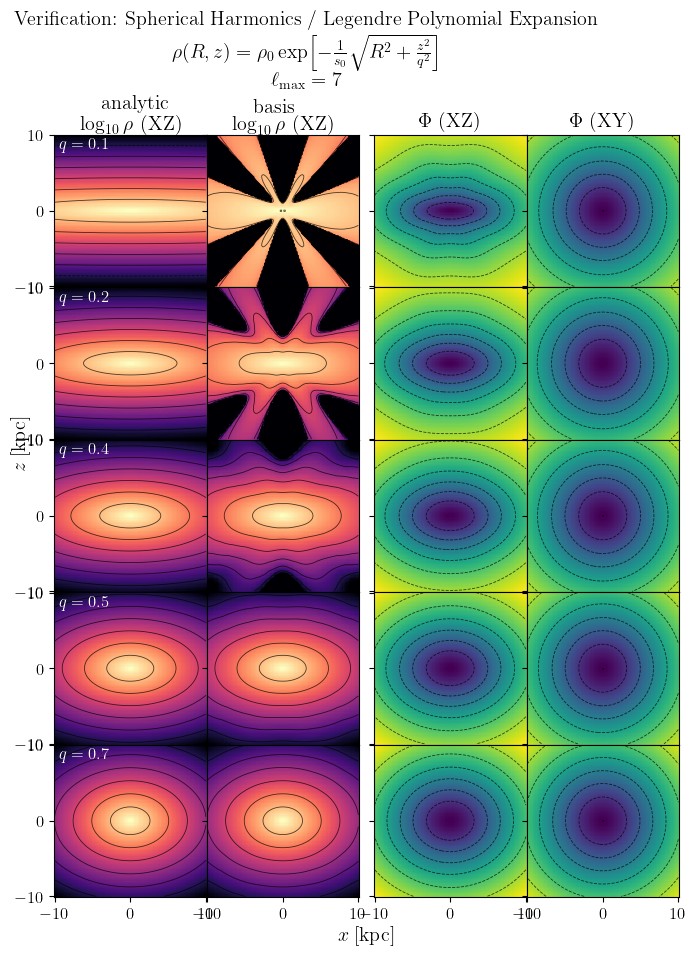

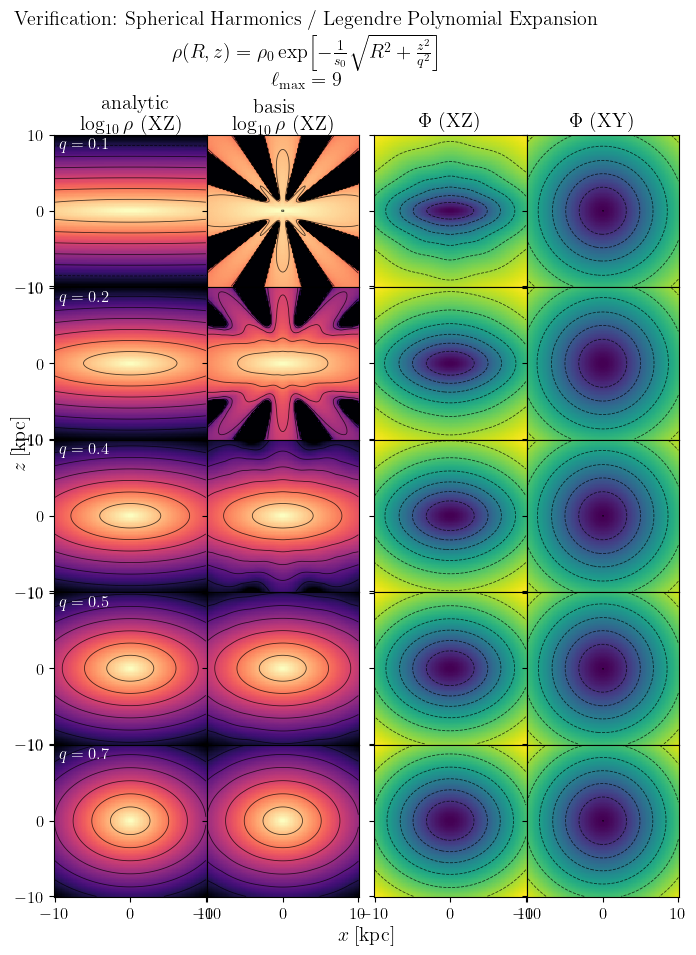

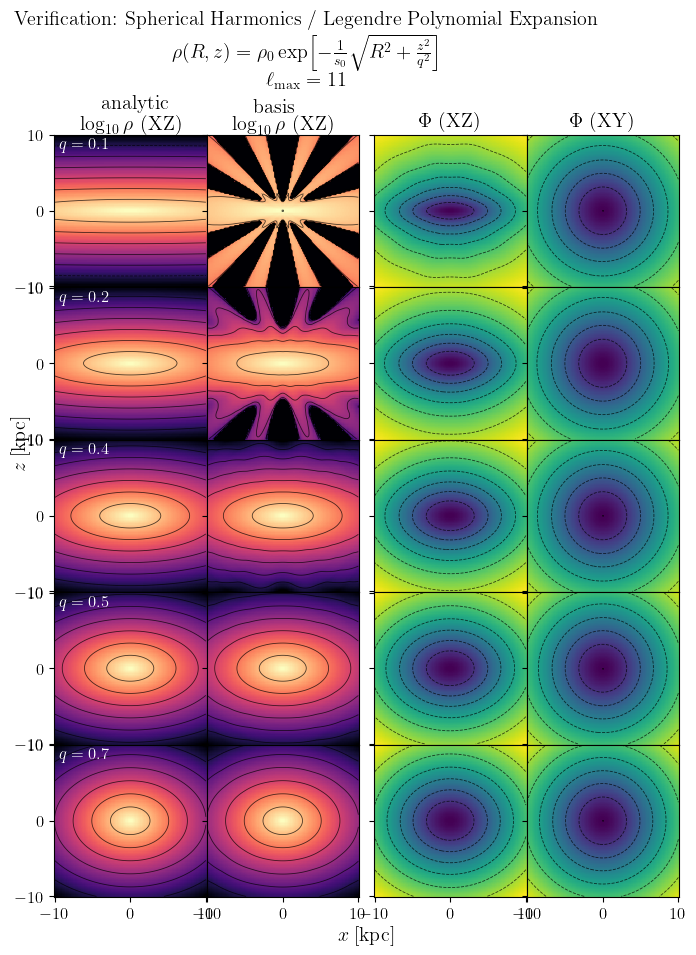

...

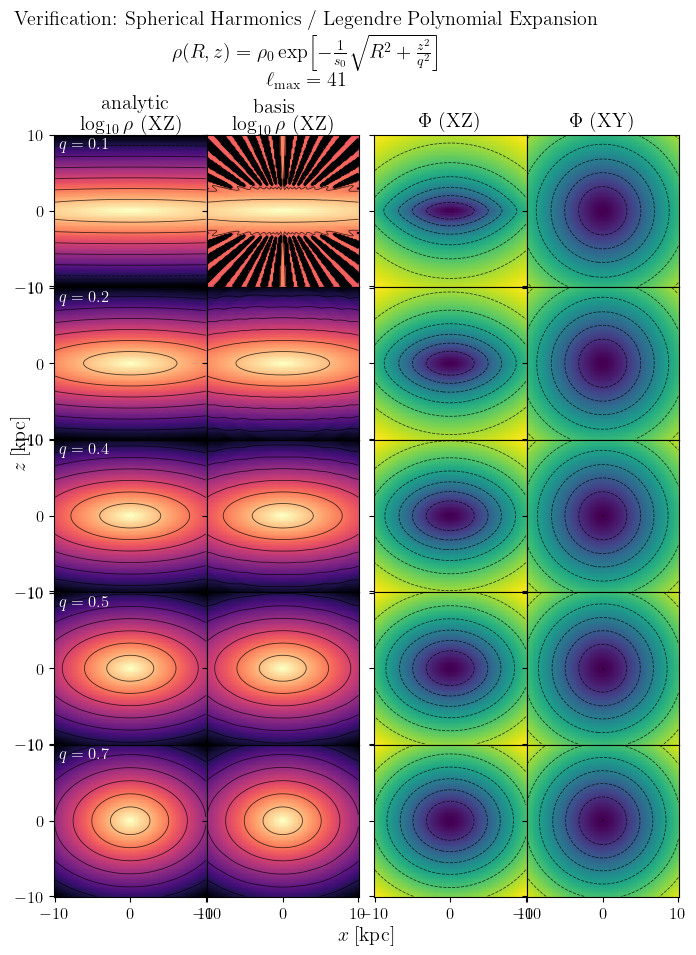

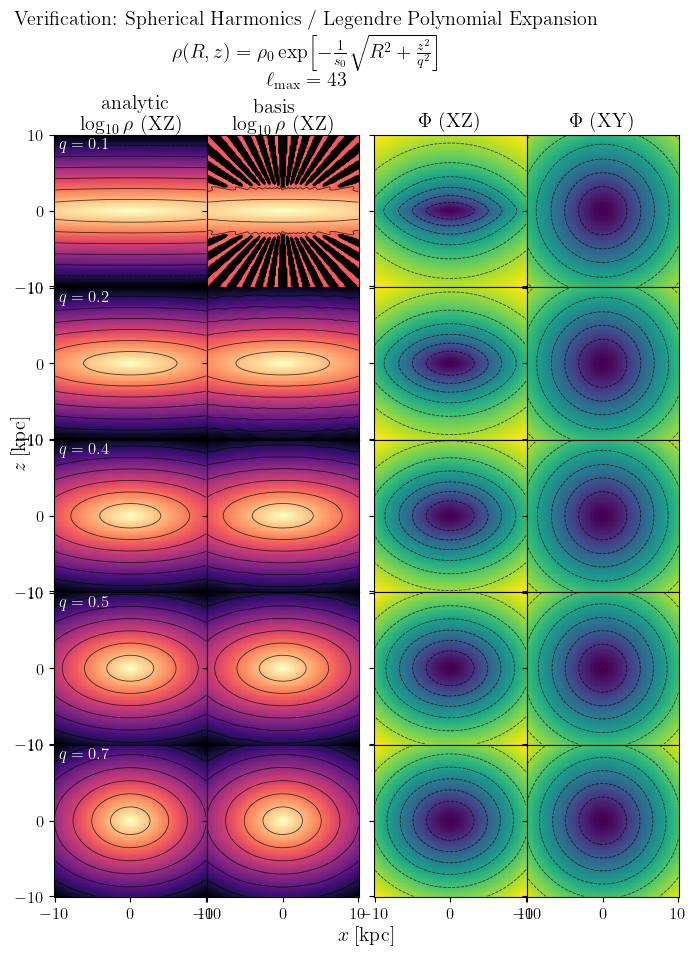

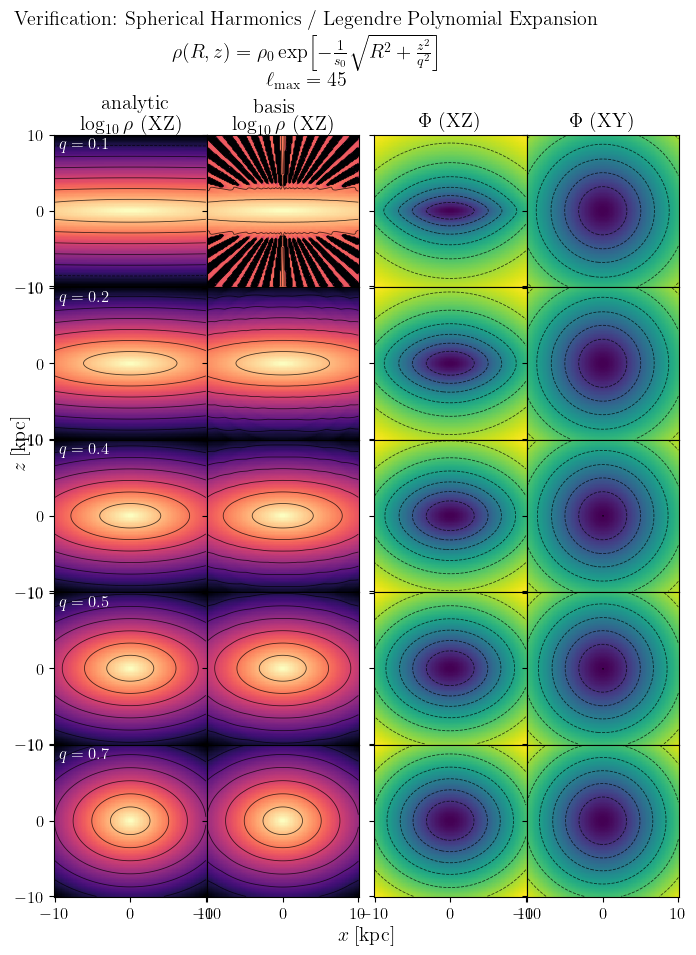

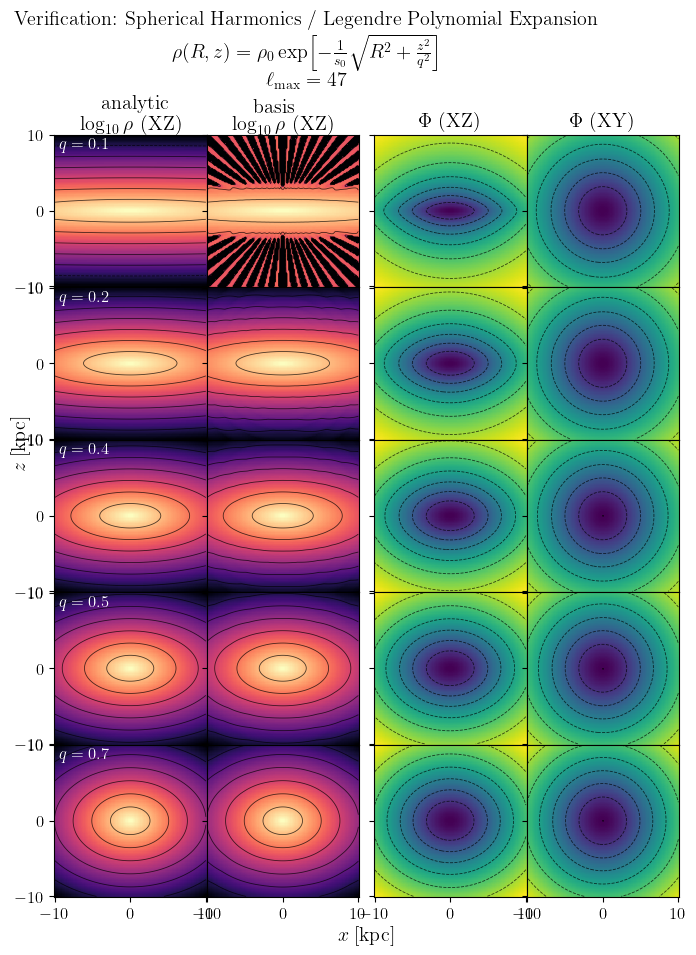

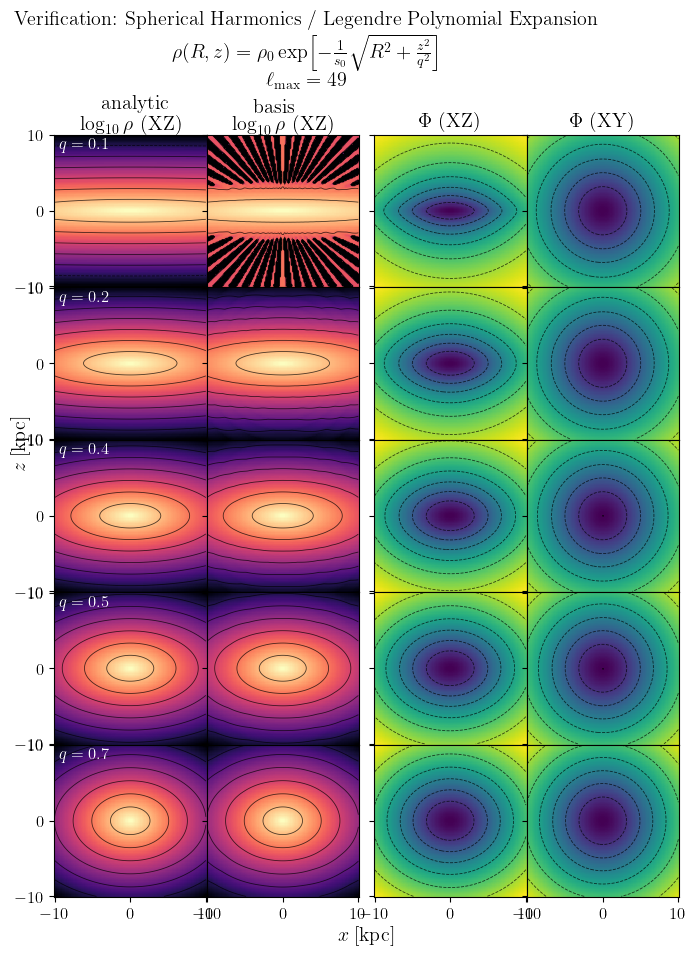

In [4]:
for lmax in lmax_values:
    title_text = (
        "Verification: Spherical Harmonics / Legendre Polynomial Expansion\n"
        r"$\rho(R,z)=\rho_0\exp\!\left[-\frac{1}{s_0}\sqrt{R^2+\frac{z^2}{q^2}}\right]$"
        + f"\n$\\ell_{{\\max}}={lmax}$"
    )

    fig, axes = make_nx4_panel(
        nrows=len(q_values),
        gap=0.15,
        y_label_space=0.8,
        x_label_space=0.8,
        xlabel=r"$x\;[\mathrm{kpc}]$",
        ylabel=r"$z\;[\mathrm{kpc}]$",
        title=title_text,
    )

    for row, q in enumerate(q_values):
        params = np.array([G, rho0, s0, q], dtype=float)
        potential_fn = tstrippy.potentials.exponential_oblate_halo
        basis_r_grid, basis_rho_l_grid = init_basis_tables(
            potential_fn, params, G, lmax, nr, rmin, rmax
        )
        maps = build_plane_maps(
            potential_fn, params, rho0, s0, q, basis_r_grid, basis_rho_l_grid, lmax, rlim=10.0, npoints=120
        )
        plot_row(axes[row, :], maps, q)

    axes[0, 0].set_title(r"analytic \\$\log_{10}\rho$ (XZ)")
    axes[0, 1].set_title(r"basis\\ $\log_{10}\rho$ (XZ)")
    axes[0, 2].set_title(r"$\Phi$ (XZ)")
    axes[0, 3].set_title(r"$\Phi$ (XY)")

    plt.show()
    plt.close(fig)